In [4]:
import csv
import pandas as pd

import pandas as pd
import altair as alt

bussiness_licences = "business-licences-hackathon.csv"
file = open(bussiness_licences, "r")
reader = pd.read_csv(file, sep=';')

/opt/miniconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [5]:
df_no_nan = reader.dropna(subset=['BusinessName'])
businesses_names = df_no_nan[~df_no_nan.BusinessName.str.contains('(', regex=False)].BusinessName.unique()

business_trade_names = df_no_nan[df_no_nan['BusinessName'].str.contains('(', regex=False)]["BusinessTradeName"].unique()

In [6]:
df_no_nan.head()

,FOLDERYEAR,LicenceRSN,LicenceNumber,LicenceRevisionNumber,BusinessName,BusinessTradeName,Status,IssuedDate,ExpiredDate,BusinessType,...,Street,City,Province,Country,PostalCode,LocalArea,NumberofEmployees,FeePaid,ExtractDate,Geom
0,14,2180123,14-160030,0,Golden Trim Enterprises Inc,Floorhaus,Issued,2013-12-05T19:08:53-05:00,2014-12-31,Wholesale Dealer w/ Anc. Retail,...,W 3RD AV,Vancouver,BC,CA,V5Y 1G1,Mount Pleasant,4.0,262.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1098925..."
1,14,2180373,14-160220,0,Tamton Networking Inc,Tam Ton Training,Issued,2014-02-26T16:08:59-05:00,2014-12-31,Instruction,...,W PENDER ST,Vancouver,BC,CA,V6B 6N9,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1067518..."
2,14,2180374,14-160221,0,Jack W Chow Insurance Services Ltd,NaN,Issued,2013-12-06T11:57:32-05:00,2014-12-31,Office,...,E PENDER ST,Vancouver,BC,CA,V6A 1S9,Downtown,10.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1040791..."
3,14,2180382,14-160226,0,Time Education Inc,NaN,Cancelled,NaN,NaN,Educational,...,GRANVILLE ST,Vancouver,BC,CA,V6M 4J7,Kerrisdale,2.0,51.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1401383..."
4,13,2180556,13-449866,0,(Maiko Sato),Nankurunaisa Education Services,Issued,2013-12-17T16:18:45-05:00,2013-12-31,Referral Services,...,NaN,Vancouver,BC,CA,NaN,Riley Park,1.0,62.0,2019-07-21T16:49:13-04:00,NaN


In [14]:
df_no_nan["Geom"].head(1)

0    {"type": "Point", "coordinates": [-123.1098925...
Name: Geom, dtype: object

In [113]:
df_no_nan = df_no_nan.dropna()

In [114]:
df_geom = pd.DataFrame(df_no_nan["Geom"])
#df_geom = df_geom[0:5]
df_geom

,Geom
1,"{""type"": ""Point"", ""coordinates"": [-123.1067518..."
8,"{""type"": ""Point"", ""coordinates"": [-123.0483554..."
13,"{""type"": ""Point"", ""coordinates"": [-123.1224903..."
14,"{""type"": ""Point"", ""coordinates"": [-123.1224903..."
41,"{""type"": ""Point"", ""coordinates"": [-123.0700271..."
...,...
568726,"{""type"": ""Point"", ""coordinates"": [-123.1837341..."
568728,"{""type"": ""Point"", ""coordinates"": [-123.1134309..."
568731,"{""type"": ""Point"", ""coordinates"": [-123.1453144..."
568893,"{""type"": ""Point"", ""coordinates"": [-123.1160729..."


In [115]:
long_list = []
lat_list = []
long_list_clean = []
lat_list_clean = []

for value in df_geom["Geom"]: 
    if type(value) is str:
        long = value[34:-20]
        lat = value[53:-2]
        long_list.append(long)
        lat_list.append(lat)
        long_list_clean.append(long)
        lat_list_clean.append(lat)
    else:
        long_list.append("NaN")
        lat_list.append("NaN")

In [116]:
df_coordinates = df_no_nan.copy()

df_coordinates["longitude"] = long_list
df_coordinates["latitude"] = lat_list

In [117]:
df_coordinates.head()

,FOLDERYEAR,LicenceRSN,LicenceNumber,LicenceRevisionNumber,BusinessName,BusinessTradeName,Status,IssuedDate,ExpiredDate,BusinessType,...,Province,Country,PostalCode,LocalArea,NumberofEmployees,FeePaid,ExtractDate,Geom,longitude,latitude
1,14,2180373,14-160220,0,Tamton Networking Inc,Tam Ton Training,Issued,2014-02-26T16:08:59-05:00,2014-12-31,Instruction,...,BC,CA,V6B 6N9,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1067518...",-123.10675185667,49.280289660285
8,14,2180639,14-160379,0,0384503 BC Ltd,Westcoast Guitars,Issued,2014-01-30T14:18:00-05:00,2014-12-31,Retail Dealer - Food,...,BC,CA,V5K 1Z8,Hastings-Sunrise,2.0,243.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0483554...",-123.048355494878,49.2814150124301
13,13,2181388,13-450198,0,David E Turner (David Turner),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:24:45-05:00,2013-12-31,Office,...,BC,CA,V6E 4H3,West End,47.0,158.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490354875,49.2848518559734
14,13,2181391,13-450199,0,Brian E Vick (Brian Vick),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:27:25-05:00,2013-12-31,Office,...,BC,CA,V6E 4H3,West End,47.0,147.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490354875,49.2848518559734
41,14,2182741,14-161661,0,Grace Brinkman & Corine Skala & Sandra Weissinger,Commercial Drive Midwives,Issued,2013-12-24T15:37:55-05:00,2014-12-31,Health Services,...,BC,CA,V5N 4B8,Grandview-Woodland,2.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0700271...",-123.070027182777,49.2626156365514


In [124]:
import plotly.express as px
import geopandas as gpd

#geo_df = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))

#px.set_mapbox_access_token(open(".mapbox_token").read())
#fig = px.scatter_geo(df_coordinates,
#                    lat="latitude",
#                    lon="longitude",
#                    hover_name="BusinessName")
#fig.show()

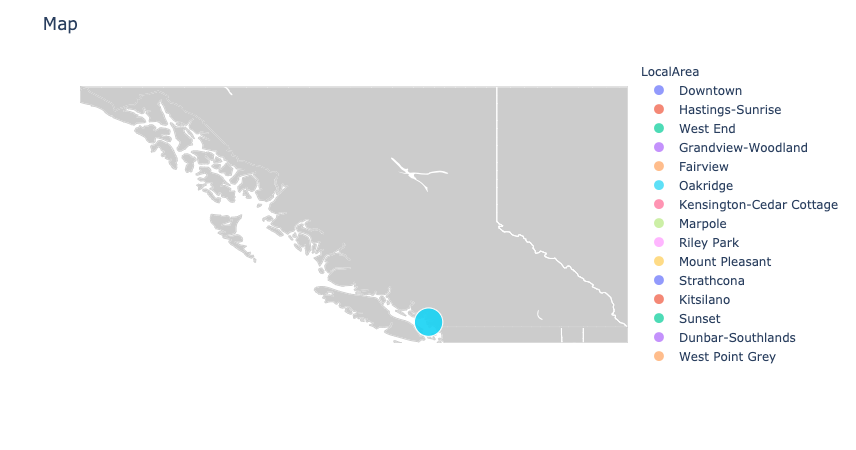

In [150]:
import plotly.express as px
fig = px.scatter_geo(df_coordinates, lat = "latitude", lon = "longitude", scope="north america",
                    #lataxis = [40,70],
                    #lonaxis = [-130,-55],
                     color="LocalArea", # which column to use to set the color of markers
                     hover_name="BusinessName", # column added to hover information
                     size="NumberofEmployees", # size of markers
                     projection="natural earth")

#fig.update_geos(fitbounds="locations")


fig.update_layout(
    title_text = 'Map',
    geo = dict(
        resolution = 50,
        showland = True,
        showlakes = True,
        landcolor = 'rgb(204, 204, 204)',
        countrycolor = 'rgb(204, 204, 204)',
        lakecolor = 'rgb(255, 255, 255)',
        projection_type = "equirectangular",
        coastlinewidth = 2,
        lataxis = dict(
            range = [48.30,60.00],
            #showgrid = True,
            #dtick = 10
        ),
        lonaxis = dict(
            range = [-139.06,-114.0],
            #showgrid = True,
            #dtick = 20
        ),
    )
)
#-139.06 | 48.30 | -114.03 | 60.00

fig.show()

In [ ]:
import configparser
config = configparser.read('config.ini')
mapbox_token = config['mapbox']['secret_token']

In [157]:
import configparser
config = configparser.ConfigParser()
secret_token='sk.eyJ1IjoicmFjaGVseXdvbmciLCJhIjoiY2ttOHI4MG4yMTl2MDJvdzB1d2Jlbmt6ciJ9.uIabea_BvRzvBvlsQYtC6w'
blah = config.read('config.ini')
mapbox_token = config['mapbox']['secret_token']

KeyError: 'mapbox'

In [ ]:
# Create the figure and feed it all the prepared columns
fig = go.Figure(
    go.Scattermapbox(
        lat=tmp['lat'],
        lon=tmp['lon'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=tmp['size'],
            color=tmp['color']
        )
    )
)

# Specify layout information
fig.update_layout(
    mapbox=dict(
        accesstoken=mapbox_access_token, #
        center=go.layout.mapbox.Center(lat=45, lon=-73),
        zoom=1
    )
)

# Display the figure
fig.show()

In [162]:
import plotly.express as px


fig = px.scatter_mapbox(df_coordinates, lat="latitude", lon="longitude", hover_name="LocalArea", hover_data=["BusinessName"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [381]:
df_coordinates['latitude'] = df_coordinates['latitude'].astype(float)
df_coordinates['longitude'] = df_coordinates['longitude'].astype(float)

In [422]:
#import descartes
%matplotlib inline
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import descartes

In [423]:
street_map = gpd.read_file("ne")

In [424]:
geometry = [Point(xy) for xy in zip(df_coordinates["longitude"], df_coordinates["latitude"])]
#geometry=gpd.points_from_xy(df_coordinates.longitude, df_coordinates.latitude)
#geometry[:3]

In [425]:
#crs = {'proj': 'latlong', 'ellps': 'WGS84', 'datum': 'WGS84', 'no_defs': True}
crs={'init':'epsg:4326'}
geo_df = gpd.GeoDataFrame(df_coordinates, geometry = geometry, crs = crs)
#geo_df.set_crs(epsg=3395, inplace=True) #epsg=3395
geo_df.head(10)

/opt/miniconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



,FOLDERYEAR,LicenceRSN,LicenceNumber,LicenceRevisionNumber,BusinessName,BusinessTradeName,Status,IssuedDate,ExpiredDate,BusinessType,...,Country,PostalCode,LocalArea,NumberofEmployees,FeePaid,ExtractDate,Geom,longitude,latitude,geometry
1,14,2180373,14-160220,0,Tamton Networking Inc,Tam Ton Training,Issued,2014-02-26T16:08:59-05:00,2014-12-31,Instruction,...,CA,V6B 6N9,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1067518...",-123.106752,49.280290,POINT (-123.10675 49.28029)
8,14,2180639,14-160379,0,0384503 BC Ltd,Westcoast Guitars,Issued,2014-01-30T14:18:00-05:00,2014-12-31,Retail Dealer - Food,...,CA,V5K 1Z8,Hastings-Sunrise,2.0,243.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0483554...",-123.048355,49.281415,POINT (-123.04836 49.28142)
13,13,2181388,13-450198,0,David E Turner (David Turner),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:24:45-05:00,2013-12-31,Office,...,CA,V6E 4H3,West End,47.0,158.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490,49.284852,POINT (-123.12249 49.28485)
14,13,2181391,13-450199,0,Brian E Vick (Brian Vick),Edwards Kenny & Bray LLP,Issued,2013-12-18T17:27:25-05:00,2013-12-31,Office,...,CA,V6E 4H3,West End,47.0,147.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1224903...",-123.122490,49.284852,POINT (-123.12249 49.28485)
41,14,2182741,14-161661,0,Grace Brinkman & Corine Skala & Sandra Weissinger,Commercial Drive Midwives,Issued,2013-12-24T15:37:55-05:00,2014-12-31,Health Services,...,CA,V5N 4B8,Grandview-Woodland,2.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.0700271...",-123.070027,49.262616,POINT (-123.07003 49.26262)
44,13,2182930,13-451151,0,(Asheesh Arora),Arora Law,Issued,2013-12-01T15:06:55-05:00,2013-12-31,Office,...,CA,V6H 1E1,Fairview,1.0,62.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1375450...",-123.137545,49.264233,POINT (-123.13755 49.26423)
45,14,2182935,14-161792,0,(Asheesh Arora),Arora Law,Issued,2013-12-12T15:07:44-05:00,2014-12-31,Office,...,CA,V6H 1E1,Fairview,1.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1375450...",-123.137545,49.264233,POINT (-123.13755 49.26423)
56,13,2183454,13-451458,0,Ban Dao (Oakridge) Seafood Restaurant Inc,Peninsula (Oakridge) Seafood Restaurant,Issued,2013-12-16T16:58:21-05:00,2013-12-31,Restaurant Class 1,...,CA,V5Z 2M9,Oakridge,35.0,107.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1188548...",-123.118855,49.232065,POINT (-123.11885 49.23207)
57,14,2183461,14-162124,0,(Donna Diskos),Grant Thornton LLP,Issued,2013-12-13T15:16:55-05:00,2014-12-31,Financial Services,...,CA,V6B 0A4,Downtown,0.0,130.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1124684...",-123.112468,49.285309,POINT (-123.11247 49.28531)
66,14,2184152,14-162606,0,Emily Rachel Johnson (Emily Johnson),Pearl Whitening Boutique,Issued,2013-12-16T11:54:39-05:00,2014-12-31,Health Services,...,CA,V6J 3B5,Fairview,1.0,181.0,2019-07-21T16:49:13-04:00,"{""type"": ""Point"", ""coordinates"": [-123.1407044...",-123.140704,9.266468,POINT (-123.14070 9.26647)


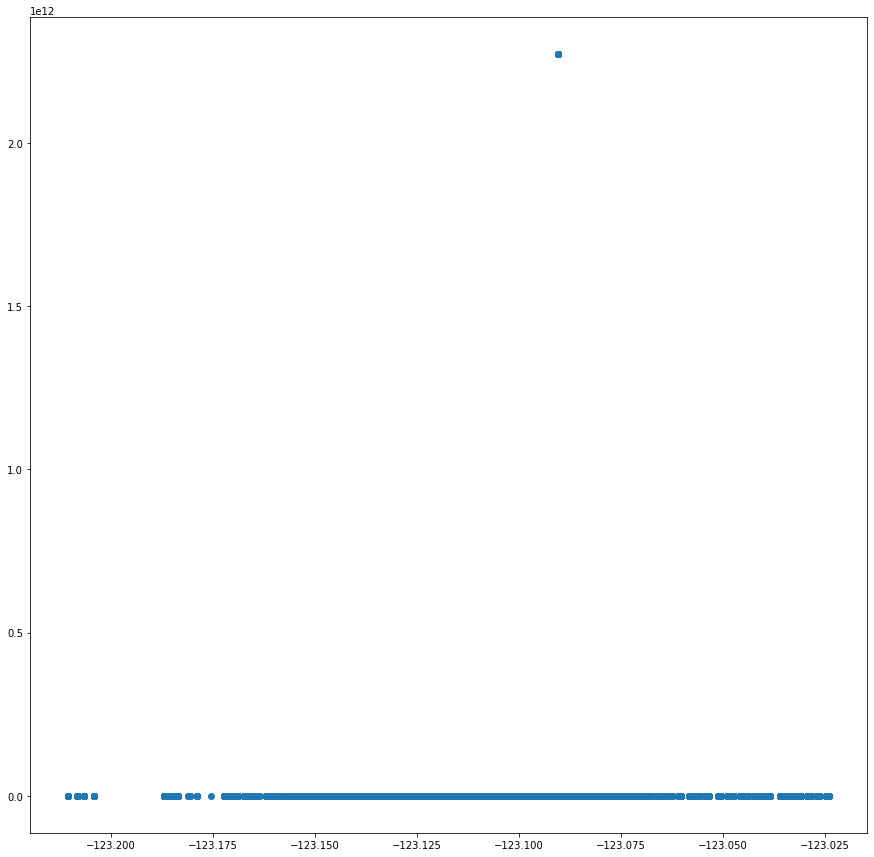

In [449]:
fig,ax = plt.subplots(figsize = (15,15))
plt.scatter("longitude","latitude", data =df_coordinates, zorder = 2)

In [446]:
geo_df = geo_df[(geo_df['latitude'] < 49.30) & (geo_df['latitude'] > 49.20)] 

<AxesSubplot:>

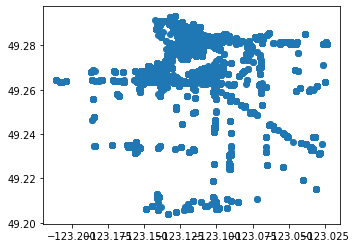

In [447]:
geo_df.plot()

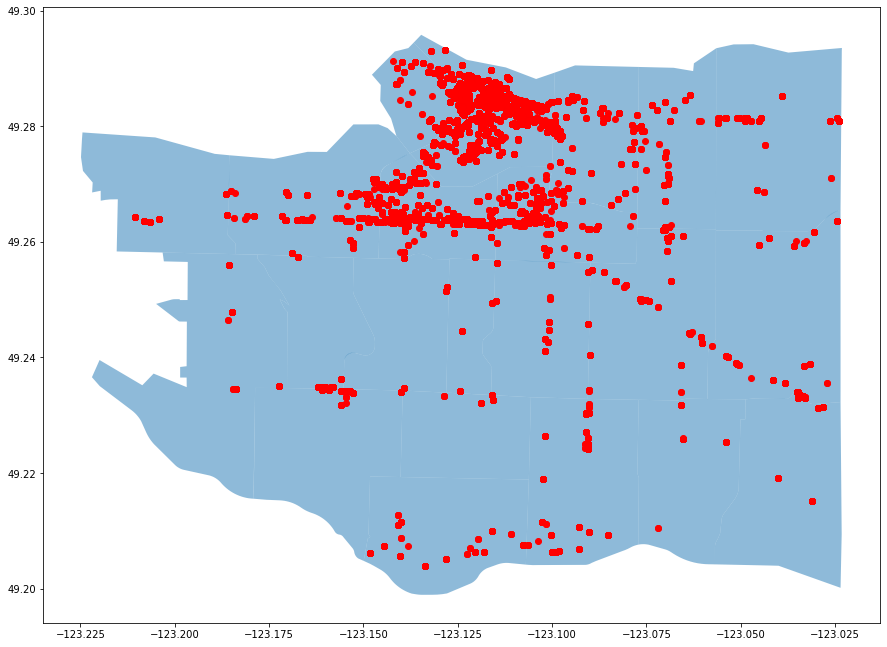

In [448]:
fig,ax = plt.subplots(figsize = (15,15))
#ax.ticklabel_format(useOffset=False, style='plain')
street_map.plot(ax = ax, alpha = 0.5, zorder = 1)
geo_df.plot(ax=ax, color = "red", marker="o")
#plot = gpd.GeoSeries(geo_df).plot(ax=ax, color='r')
#x = [480000, 480020, 490000, 500000, 505050, 500420, 493800, 473900, 493000, 500400]
#y = [5.45, 5.459, 5.44, 5.49, 5.459, 5.48, 5.46, 5.46, 5.45, 5.43]
#x, y = [geo_df['longitude'].values], [geo_df['latitude'].values]
#plt.scatter("longitude","latitude", data =df_coordinates, zorder = 2)
#ax.scatter(x, y, marker="*", color='r', alpha=0.7, zorder=5, s=10)
#ax = geo_df.plot(color="red", figsize=(5,5))
#ax.set_xlim(-123.225, -123.025)
plt.show()

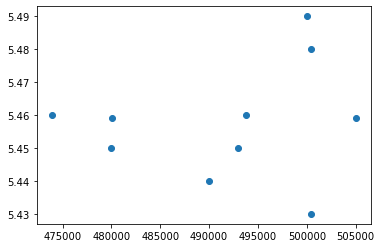

In [373]:
plt.scatter(x,y)
plt.show()